# step 0: goal definition

We want to detect fraud transactions from list of credit card transactions.

# step 1: data acquisition

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder,OneHotEncoder
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay, roc_curve

In [5]:
df_fraud = pd.read_csv('./credit_card_transactions.csv', sep=',') #import from csv source

The Credit Card Transactions Dataset provides detailed records of credit card transactions, including information about transaction times, amounts, and associated personal and merchant details.

In [6]:
# We leave first 10000 lines
df_small = df_fraud.head(10000)

# And save this file
df_small.to_csv('credit_card_transactions_small.csv', index=False)

# step 2: data exploration 

In [9]:
df_small.head(3)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,28705.0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,NaN
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,83236.0


In [11]:
df_small.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             10000 non-null  int64  
 1   trans_date_trans_time  10000 non-null  object 
 2   cc_num                 10000 non-null  int64  
 3   merchant               10000 non-null  object 
 4   category               10000 non-null  object 
 5   amt                    10000 non-null  float64
 6   first                  10000 non-null  object 
 7   last                   10000 non-null  object 
 8   gender                 10000 non-null  object 
 9   street                 10000 non-null  object 
 10  city                   10000 non-null  object 
 11  state                  10000 non-null  object 
 12  zip                    10000 non-null  int64  
 13  lat                    10000 non-null  float64
 14  long                   10000 non-null  float64
 15  cit

In [13]:
df_small.describe(include='all')

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
count,10000.00000,10000,1.000000e+04,10000,10000,10000.000000,10000,10000,10000,10000,...,10000.000000,1.000000e+04,10000,10000,10000,1.000000e+04,10000.000000,10000.000000,10000.000000,8462.000000
unique,NaN,9895,NaN,693,14,NaN,335,462,2,903,...,NaN,NaN,475,889,10000,NaN,NaN,NaN,NaN,NaN
top,NaN,2019-01-01 16:52:19,NaN,fraud_Kilback LLC,gas_transport,NaN,Christopher,Smith,F,43039 Riley Greens Suite 393,...,NaN,NaN,"Designer, ceramics/pottery",1977-03-23,0b242abb623afc578575680df30655b9,NaN,NaN,NaN,NaN,NaN
freq,NaN,3,NaN,36,1071,NaN,205,211,5485,40,...,NaN,NaN,78,47,1,NaN,NaN,NaN,NaN,NaN
mean,4999.50000,NaN,4.240166e+17,NaN,NaN,68.413486,NaN,NaN,NaN,NaN,...,-90.617579,8.985338e+04,NaN,NaN,NaN,1.325645e+09,38.593578,-90.608638,0.004700,47169.767313
std,2886.89568,NaN,1.318553e+18,NaN,NaN,111.527924,NaN,NaN,NaN,NaN,...,14.458799,3.001198e+05,NaN,NaN,NaN,1.679003e+05,5.209553,14.476713,0.068399,26141.220963
min,0.00000,NaN,6.041621e+10,NaN,NaN,1.010000,NaN,NaN,NaN,NaN,...,-165.672300,2.300000e+01,NaN,NaN,NaN,1.325376e+09,19.165823,-166.550779,0.000000,1002.000000
25%,2499.75000,NaN,1.800365e+14,NaN,NaN,9.690000,NaN,NaN,NaN,NaN,...,-97.171400,7.410000e+02,NaN,NaN,NaN,1.325472e+09,34.847390,-97.224395,0.000000,24828.000000
50%,4999.50000,NaN,3.520550e+15,NaN,NaN,48.675000,NaN,NaN,NaN,NaN,...,-87.724600,2.398000e+03,NaN,NaN,NaN,1.325654e+09,39.370857,-87.664080,0.000000,46160.000000
75%,7499.25000,NaN,4.657269e+15,NaN,NaN,83.092500,NaN,NaN,NaN,NaN,...,-80.128400,1.909000e+04,NaN,NaN,NaN,1.325801e+09,41.899369,-80.181638,0.000000,68777.750000


In [15]:
df_fraud.is_fraud.value_counts()

is_fraud
0    1289169
1       7506
Name: count, dtype: int64

In [17]:
df_small.is_fraud.value_counts()

is_fraud
0    9953
1      47
Name: count, dtype: int64

As a result, we have 9953 true transactions and 47 fraud. We can conclude that our dataset is unbalanced.

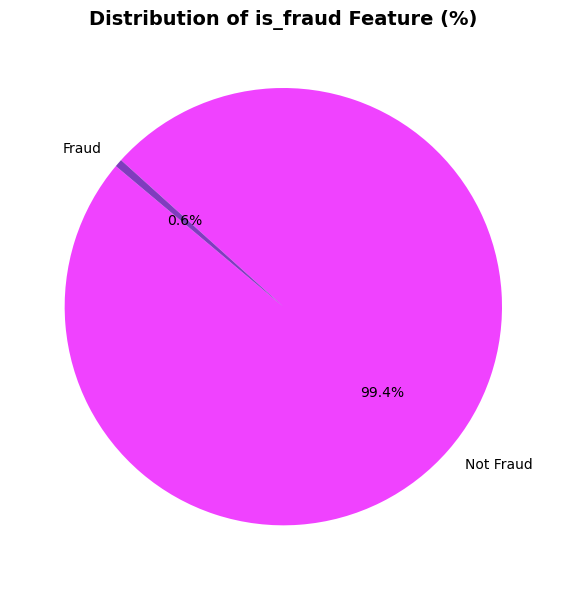

In [19]:
# Counting the number of values in the binary feature
fraud_counts = df_fraud['is_fraud'].value_counts()

# pie chart
plt.figure(figsize=(6, 6))
plt.pie(fraud_counts, labels=['Not Fraud', 'Fraud'], 
        autopct='%1.1f%%', startangle=140, colors=['#f042ff', '#803cbe'])
plt.title('Distribution of is_fraud Feature (%)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

is_fraud
0    9953
1      47
Name: count, dtype: int64


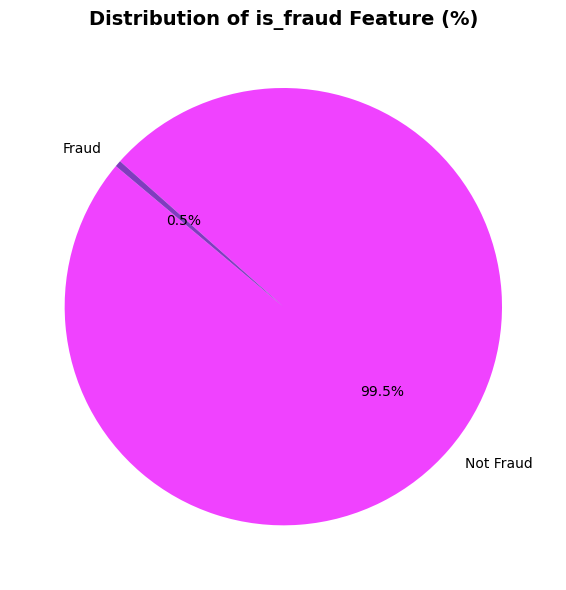

In [10]:
# Counting the number of values in the binary feature
fraud_counts = df_small['is_fraud'].value_counts()

print(fraud_counts)

# pie chart
plt.figure(figsize=(6, 6))
plt.pie(fraud_counts, labels=['Not Fraud', 'Fraud'], 
        autopct='%1.1f%%', startangle=140, colors=['#f042ff', '#803cbe'])
plt.title('Distribution of is_fraud Feature (%)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

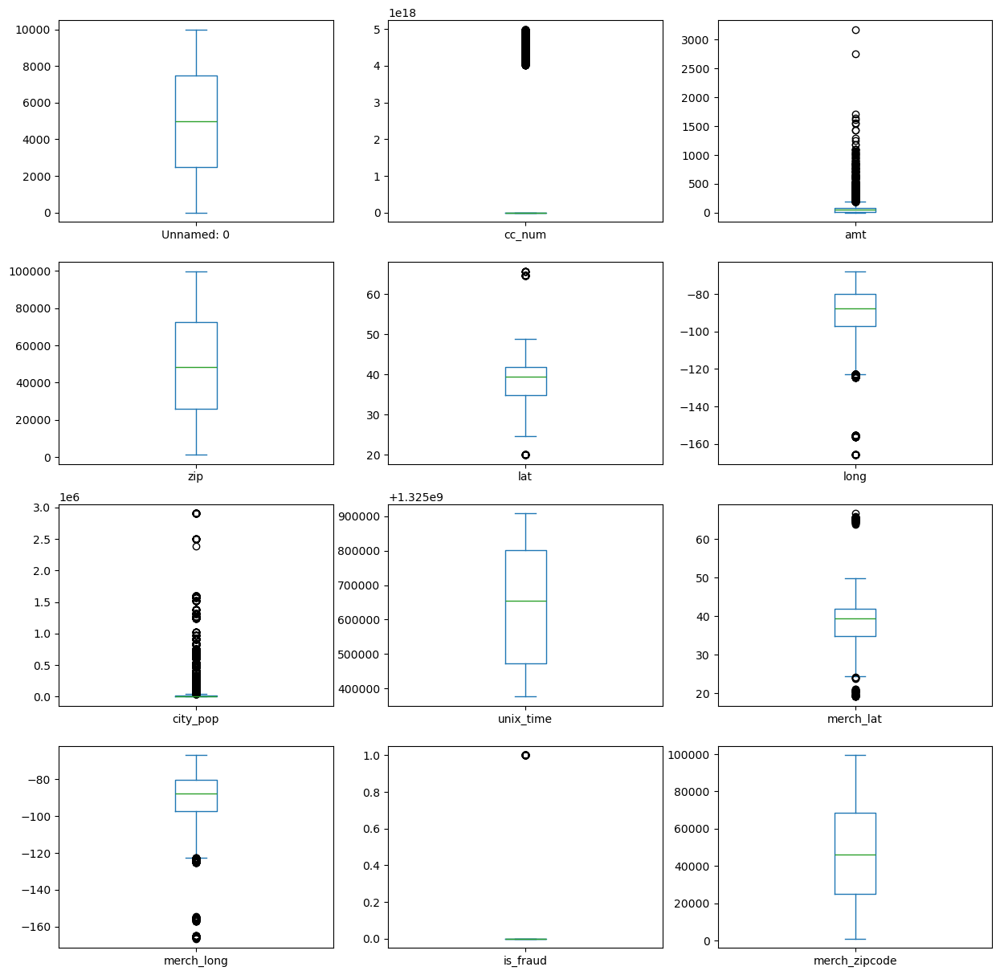

In [21]:
df_small.plot(kind ='box', 
        subplots = True, 
        figsize=(15,15),
        layout = (4,3),
        sharey=False)
plt.show()

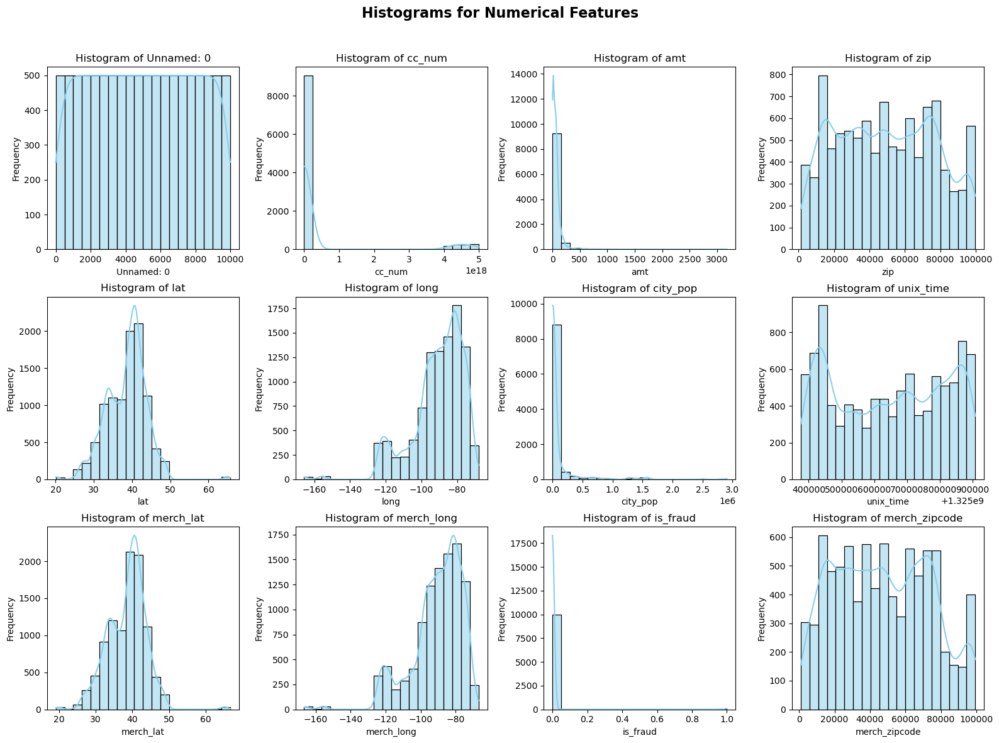

In [23]:
numerical_columns = df_small.select_dtypes(include=['float64', 'int64']).columns

n_columns = 4 
n_rows = (len(numerical_columns) + n_columns - 1) // n_columns

# Define the shape dynamically
fig, axes = plt.subplots(n_rows, n_columns, figsize=(16, 4 * n_rows)) 

axes = axes.flatten()
for i in range(len(numerical_columns), len(axes)):
    axes[i].axis('off')  # Disable unnecessary axes if there are fewer columns

for i, column in enumerate(numerical_columns):
    sns.histplot(df_small[column], kde=True, bins=20, color='skyblue', edgecolor='black', ax=axes[i])
    axes[i].set_title(f'Histogram of {column}', fontsize=12)
    axes[i].set_xlabel(column, fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=10)

plt.suptitle('Histograms for Numerical Features', fontsize=16, fontweight='bold')

# Automatic placement of plots to avoid overlap
plt.tight_layout()
plt.subplots_adjust(top=0.9)

plt.show()

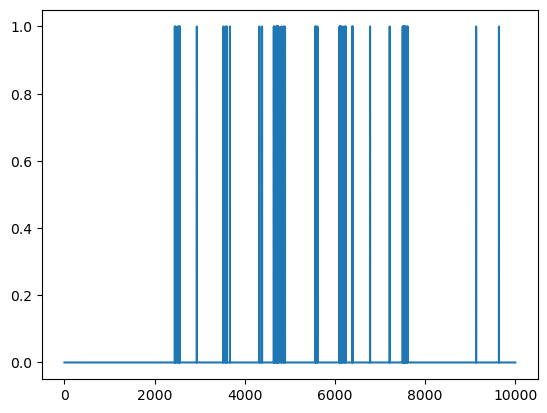

In [25]:
df_small.is_fraud.astype(int).plot();

<Axes: >

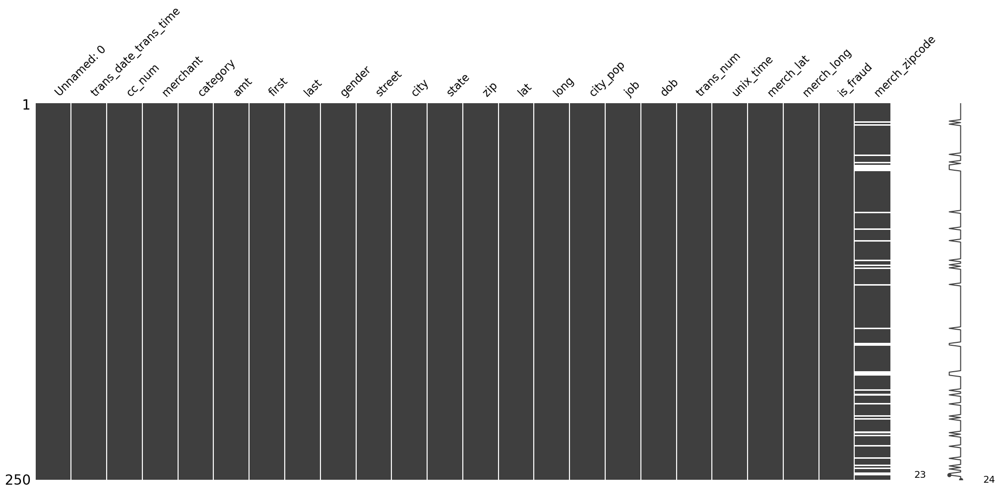

In [31]:
#!pip install missingno
import missingno as msno
%matplotlib inline
msno.matrix(df_small.sample(250))

## ProfileReport

In [35]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df_small, title="Profiling Report")
profile.to_widgets()
profile

/opt/anaconda3/lib/python3.12/site-packages/ydata_profiling/utils/dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



# step 3: preprocessing

In [37]:
df_small = df_small.drop(columns=['Unnamed: 0','merch_zipcode',], axis=1)

### data transformations

In [39]:
# Converting columns to datetime using . loc
df_small['trans_date_trans_time'] = pd.to_datetime(df_small['trans_date_trans_time'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_small['dob'] = pd.to_datetime(df_small['dob'], format='%Y-%m-%d', errors='coerce')

#df_new = df_small.copy()
#df_new.loc[:, 'trans_date_trans_time'] = pd.to_datetime(df_small['trans_date_trans_time'],format='%Y-%m-%d %H:%M:%S')
#df_new.loc[:, 'dob'] = pd.to_datetime(df_small['dob'])

def time_to_day(hour):
    if 6 <= hour < 12:
        return 'morning'
    elif 12 <= hour < 18:
        return 'day'
    elif 18 <= hour < 22:
        return 'evening'
    else:
        return 'night'

df_small['time_of_day'] = df_small['trans_date_trans_time'].dt.hour.apply(time_to_day)

enc_ordinal = OrdinalEncoder(categories=[['night','morning','day','evening']]) # set custom order
df_small['time_of_day_encoded'] = enc_ordinal.fit_transform(df_small[['time_of_day']])

In [41]:
df_small['age'] = df_small['trans_date_trans_time'].dt.year - df_small['dob'].dt.year
#df_small.loc[:, 'age'] = df_small['trans_date_trans_time'].dt.year - df_small['dob'].dt.year

# Converting age to category by using .loc
df_small.loc[(df_small['age'] >= 14) & (df_small['age'] < 21), 'age_category'] = 'Teen'
df_small.loc[(df_small['age'] >= 21) & (df_small['age'] < 35), 'age_category'] = 'Young Adult'
df_small.loc[(df_small['age'] >= 35) & (df_small['age'] < 55), 'age_category'] = 'Middle-aged'
df_small.loc[df_small['age'] >= 55, 'age_category'] = 'Senior'

# Preview the first few lines for checking
print(df_small[['age', 'age_category']].head())

enc_ordinal = OrdinalEncoder(categories=[['Teen','Young Adult','Middle-aged','Senior']]) # set custom order
df_small['age_category_encoded'] = enc_ordinal.fit_transform(df_small[['age_category']])

   age age_category
0   31  Young Adult
1   41  Middle-aged
2   57       Senior
3   52  Middle-aged
4   33  Young Adult


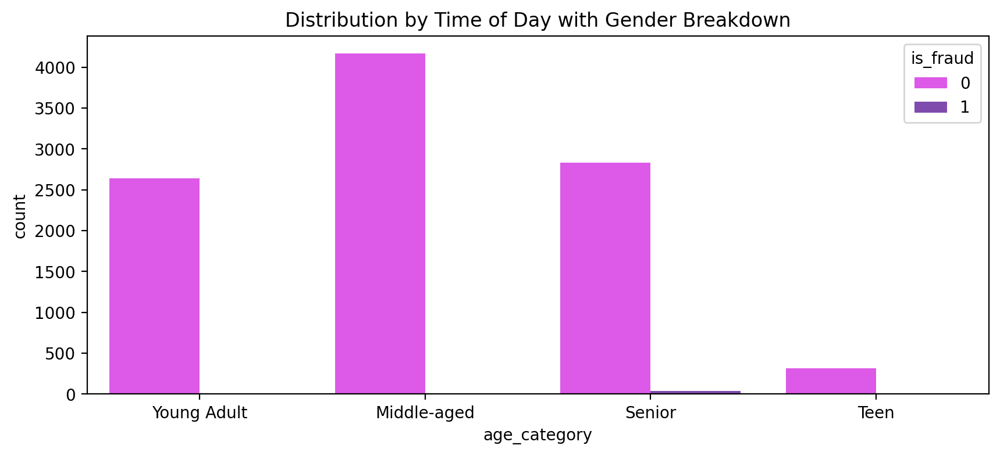

In [26]:
plt.figure(figsize=(10,4),dpi=200)
sns.countplot(x='age_category',data=df_small, hue='is_fraud', palette=['#f042ff', '#803cbe'])
plt.title('Distribution by Time of Day with Gender Breakdown');

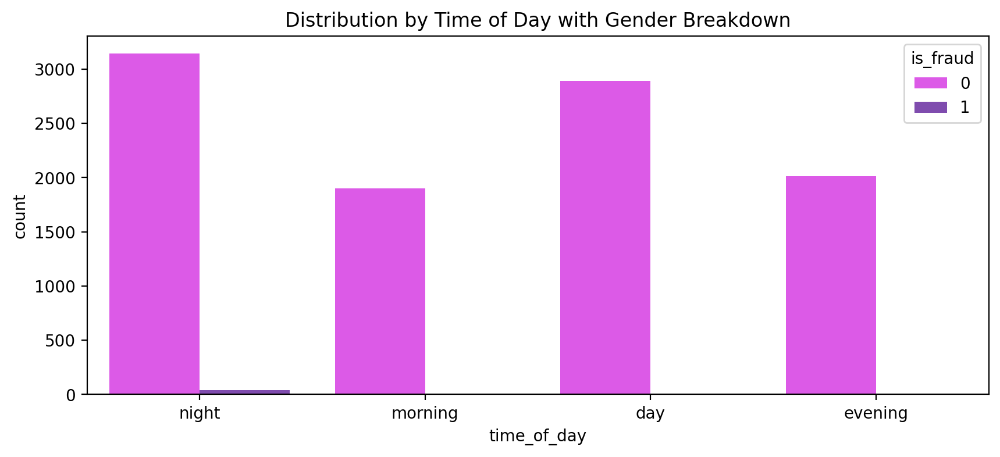

In [27]:
plt.figure(figsize=(10,4),dpi=200)
sns.countplot(x='time_of_day',data=df_small, hue='is_fraud', palette=['#f042ff', '#803cbe'])
plt.title('Distribution by Time of Day with Gender Breakdown');

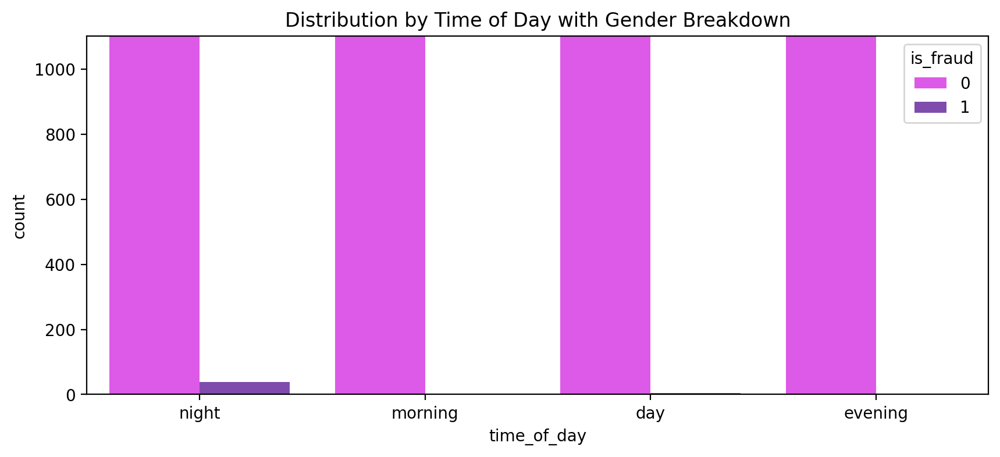

In [17]:
plt.figure(figsize=(10,4),dpi=200)
sns.countplot(x='time_of_day',data=df_small, hue='is_fraud', palette=['#f042ff', '#803cbe'])
plt.title('Distribution by Time of Day with Gender Breakdown');

current_max_y = plt.gca().get_ylim()[1] #take the current value of axes y
plt.ylim(0, current_max_y / 3)  # set up new value for axes y

plt.show()

In [28]:
df_small = df_small.drop(columns=['trans_date_trans_time','dob',], axis=1) #1-to delete column

### Feature selection

In [43]:
# Prepare our data
X = df_small.drop(columns=["is_fraud"])  # Delete target value
y = df_small["is_fraud"] 

# Divide data for training and test set
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Transformation of categorical and numerical features
numerical_features = X.select_dtypes(include=["float64", "int64"]).columns
categorical_features = X.select_dtypes(include=["object"]).columns

# To save results
correlation_scores = []
mutual_info_scores = []

for train_index, test_index in skf.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # 1. Analysis of numerical feature correlations
    correlation_matrix = X[numerical_features].corr()
    high_corr_features = correlation_matrix.columns[correlation_matrix.abs().max() > 0.5]
    print("\nFeatures with high correlation:\n", high_corr_features.tolist())
    correlation_scores.extend(high_corr_features.tolist())

    # 2. Mutual Information for all features
    X_encoded = X.copy()
    for col in categorical_features:
        X_encoded[col] = X_encoded[col].astype('category').cat.codes # Before encoded categorical features 

    mutual_info = mutual_info_classif(X_encoded, y)

    # Create DataFrame to display the results
    mutual_info_df = pd.DataFrame({
        'Feature': X.columns,
        'Mutual Information': mutual_info
    })
    
    # Sort values according to importance
    mutual_info_df = mutual_info_df.sort_values(by='Mutual Information', ascending=False)
    top_mutual_info_features = mutual_info_df.head(10)
    mutual_info_scores.extend(top_mutual_info_features['Feature'].tolist())
    print("\nTop 10 Features by Mutual Information:\n", top_mutual_info_features)

# Print result
print("\nSummary of features with high correlation:\n", pd.Series(correlation_scores).value_counts())
print("\nSummary of top features by Mutual Information:\n", pd.Series(mutual_info_scores).value_counts())



Features with high correlation:
 ['cc_num', 'amt', 'zip', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long', 'time_of_day_encoded', 'age_category_encoded']


DTypePromotionError: The DType <class 'numpy.dtypes.DateTime64DType'> could not be promoted by <class 'numpy.dtypes.Float64DType'>. This means that no common DType exists for the given inputs. For example they cannot be stored in a single array unless the dtype is `object`. The full list of DTypes is: (<class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Int16DType'>, <class 'numpy.dtypes.Int8DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Int16DType'>, <class 'numpy.dtypes.Int16DType'>, <class 'numpy.dtypes.Int8DType'>, <class 'numpy.dtypes.Int16DType'>, <class 'numpy.dtypes.Int16DType'>, <class 'numpy.dtypes.Int8DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Int16DType'>, <class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.Int16DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Int8DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Int32DType'>, <class 'numpy.dtypes.Int8DType'>, <class 'numpy.dtypes.Float64DType'>)

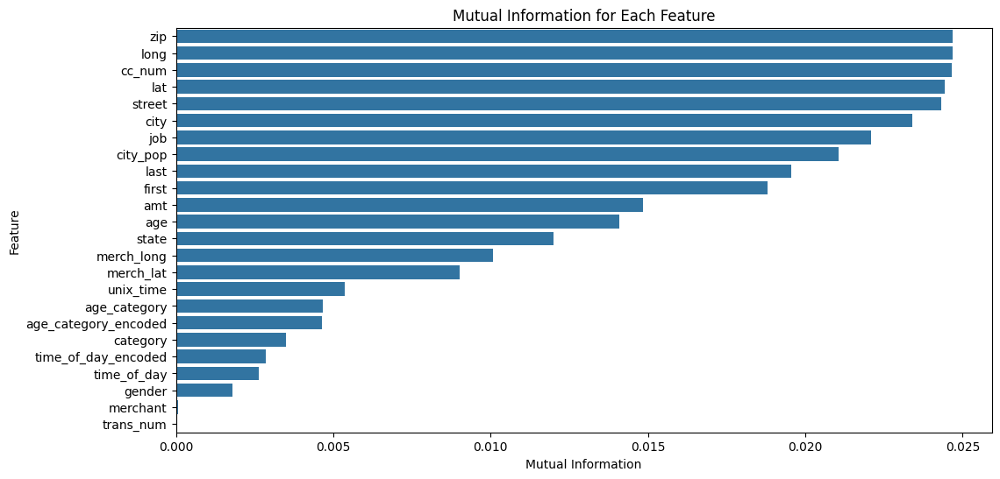

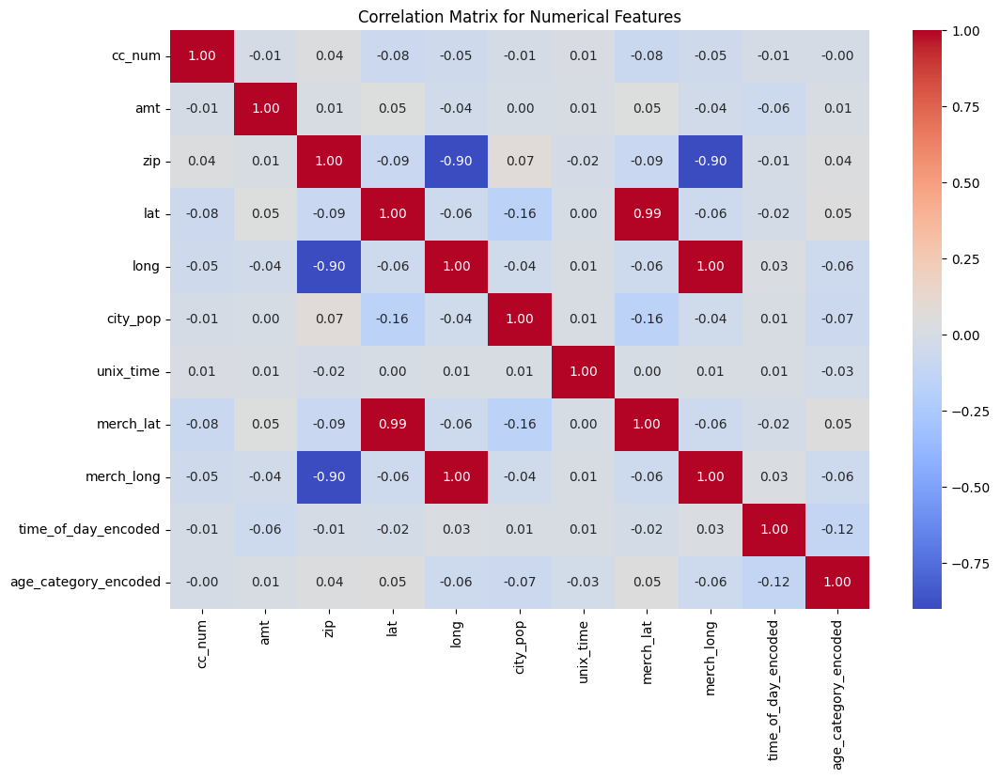

In [31]:
# Visualizing Mutual Information
plt.figure(figsize=(12, 6))
sns.barplot(x='Mutual Information', y='Feature', data=mutual_info_df)
plt.title('Mutual Information for Each Feature')
plt.show()



# Visualizing Correlation Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Numerical Features')
plt.show()

# step 4: processing

As we remember from the lectures, indications that a transaction can be fraudulent are: 
1) Account created ad hoc
2) amounts of money
3) Timings (night-time...)
4) Making Several Purchases with the Same Card but Shipping to Different Addresses
5) Re-Trying With a Smaller Amount After the First Attempt is Denied

So that's why in the result we choose features 'amt', 'city_pop', 'lat', 'long' and 'time_of_day_encoded'. Also all of them are numerical features. 


Model: Logistic Regression
Fold 1
Accuracy = 0.9660
--------------------------
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       996
           1       0.08      0.75      0.15         4

    accuracy                           0.97      1000
   macro avg       0.54      0.86      0.57      1000
weighted avg       1.00      0.97      0.98      1000

Fold 2
Accuracy = 0.9490
--------------------------
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.97       996
           1       0.07      1.00      0.14         4

    accuracy                           0.95      1000
   macro avg       0.54      0.97      0.55      1000
weighted avg       1.00      0.95      0.97      1000

Fold 3
Accuracy = 0.9570
--------------------------
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96     

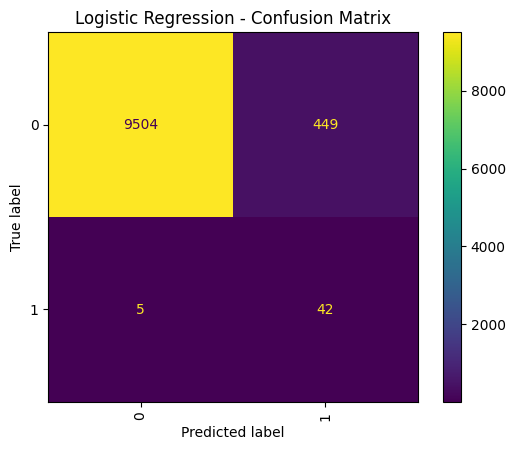

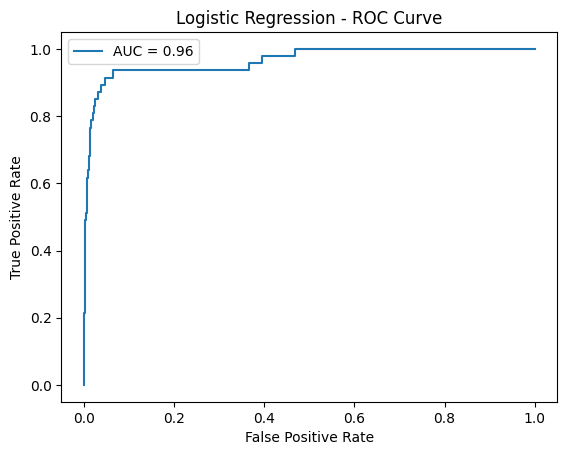


Model: Random Forest
Fold 1
Accuracy = 0.9960
--------------------------
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       996
           1       0.50      0.50      0.50         4

    accuracy                           1.00      1000
   macro avg       0.75      0.75      0.75      1000
weighted avg       1.00      1.00      1.00      1000

Fold 2
Accuracy = 0.9990
--------------------------
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       996
           1       0.80      1.00      0.89         4

    accuracy                           1.00      1000
   macro avg       0.90      1.00      0.94      1000
weighted avg       1.00      1.00      1.00      1000

Fold 3
Accuracy = 0.9990
--------------------------
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00 

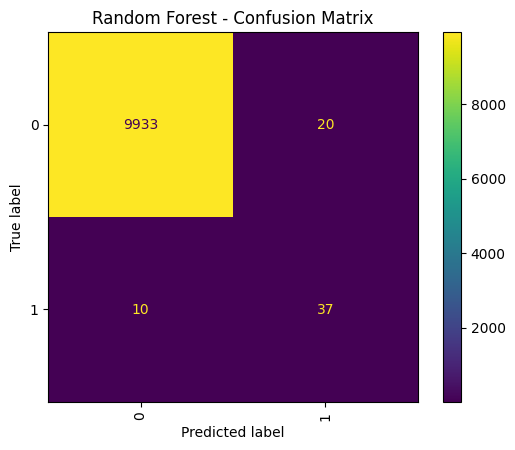

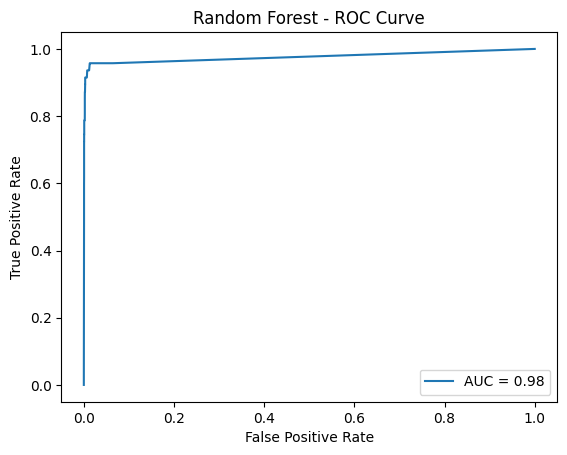


Model: KNN
Fold 1
Accuracy = 0.9790
--------------------------
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       996
           1       0.13      0.75      0.22         4

    accuracy                           0.98      1000
   macro avg       0.56      0.86      0.61      1000
weighted avg       1.00      0.98      0.99      1000

Fold 2
Accuracy = 0.9790
--------------------------
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       996
           1       0.16      1.00      0.28         4

    accuracy                           0.98      1000
   macro avg       0.58      0.99      0.63      1000
weighted avg       1.00      0.98      0.99      1000

Fold 3
Accuracy = 0.9880
--------------------------
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       996


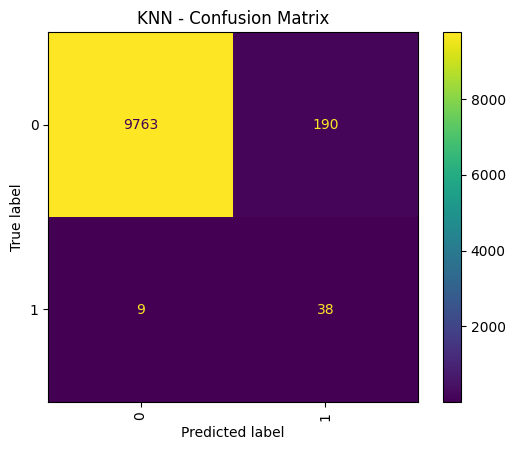

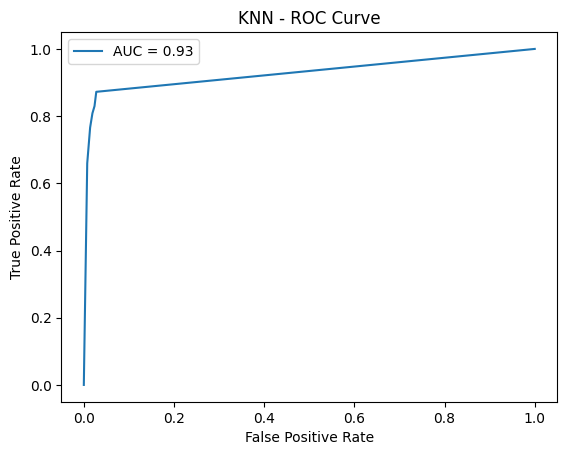

In [34]:
# Selection of the target variable and features
y = df_small['is_fraud']
X = df_small[['amt', 'city_pop', 'lat', 'long', 'time_of_day_encoded']]  # Пример: включим числовые признаки

# Scaling the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Setting up StratifiedKFold
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Metric storage for each iteration
accuracy_scores = []
roc_auc_scores = []
y_true_all = []
y_pred_all = []
y_pred_proba_all = []

# Classification models
models = {
    "Logistic Regression": LogisticRegression(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "KNN": KNeighborsClassifier()
}

# Iterating over classifiers
for model_name, model in models.items():
    print(f"\nModel: {model_name}")
    
    # Metric storage for each iteration
    accuracy_scores = []
    roc_auc_scores = []
    y_true_all = []
    y_pred_all = []
    y_pred_proba_all = []
    all_precision = []
    all_recall = []
    all_fscore = []

    # Cross-validation for training and test set
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_scaled, y)):
        print(f"Fold {fold + 1}")
        
        # Getting training and test data
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Applying SMOTE to training data
        smote = SMOTE(random_state=42)
        X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

        # Training the model
        model.fit(X_train_resampled, y_train_resampled)

        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)[:, 1]  # Для AUC

        # Calculating metrics
        acc = accuracy_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred_proba)

        accuracy_scores.append(acc)
        roc_auc_scores.append(roc_auc)

        # Saving predictions and true values for subsequent plots
        y_true_all.extend(y_test)
        y_pred_all.extend(y_pred)
        y_pred_proba_all.extend(y_pred_proba)

        # Displaying metrics
        print(f"Accuracy = {acc:.4f}")
        print("--------------------------")
        print("Classification Report:")
        print(classification_report(y_test, y_pred))

    # Final average metrics
    print("\nCross-Validation Results:")
    print(f"Mean Accuracy: {np.mean(accuracy_scores):.4f}")
    print(f"Mean ROC AUC: {np.mean(roc_auc_scores):.4f}")

    # Confusion matrix plot for the entire dataset
    conf_matrix = confusion_matrix(y_true_all, y_pred_all)
    ConfusionMatrixDisplay(conf_matrix).plot(xticks_rotation="vertical")
    plt.title(f'{model_name} - Confusion Matrix')
    plt.show()

    # ROC curve plot for the entire dataset
    fpr, tpr, thresholds = roc_curve(y_true_all, y_pred_proba_all)
    roc_auc = roc_auc_score(y_true_all, y_pred_proba_all)
    plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name} - ROC Curve')
    plt.legend()
    plt.show()

# step 5: validation 

In [36]:
from sklearn.model_selection import cross_val_score

skf_for_compa = StratifiedKFold(n_splits=10, shuffle = True, random_state = 42)

log_reg_accuracy_array = cross_val_score(LogisticRegression(max_iter=1000, random_state=42), 
                                         X_scaled, y, 
                                         cv=skf_for_compa)

rf_accuracy_array = cross_val_score(RandomForestClassifier(random_state=42), 
                                    X_scaled, y, 
                                    cv=skf_for_compa)

knn_accuracy_array = cross_val_score(KNeighborsClassifier(), 
                                     X_scaled, y, 
                                     cv=skf_for_compa)

# results
print("Logistic Regression Accuracy:", log_reg_accuracy_array)
print("Random Forest Accuracy:", rf_accuracy_array)
print("KNN Accuracy:", knn_accuracy_array)

Logistic Regression Accuracy: [0.995 0.994 0.996 0.995 0.995 0.993 0.996 0.996 0.995 0.994]
Random Forest Accuracy: [0.997 1.    0.998 0.996 0.999 0.998 0.999 0.998 0.998 0.997]
KNN Accuracy: [0.995 0.997 0.998 0.993 0.995 0.996 0.998 0.997 0.999 0.997]


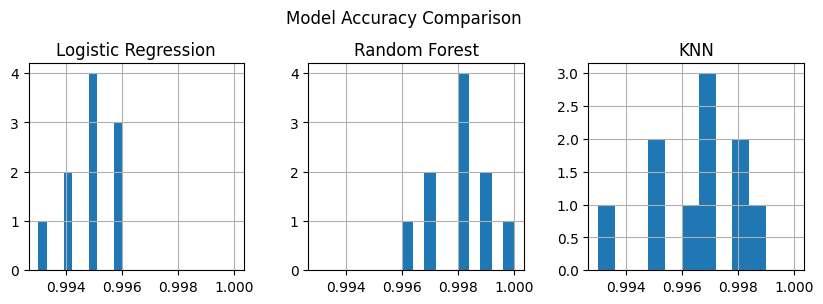

   Logistic Regression  Random Forest    KNN
0                0.995          0.997  0.995
1                0.994          1.000  0.997
2                0.996          0.998  0.998
3                0.995          0.996  0.993
4                0.995          0.999  0.995
5                0.993          0.998  0.996
6                0.996          0.999  0.998
7                0.996          0.998  0.997
8                0.995          0.998  0.999
9                0.994          0.997  0.997


In [37]:
metrics = pd.DataFrame({'Logistic Regression': log_reg_accuracy_array, 
                        'Random Forest': rf_accuracy_array, 
                        'KNN': knn_accuracy_array})

# Histograms for comparing accuracy
metrics.hist(layout=(1, 3), figsize=(10, 3), sharex=True)
plt.suptitle('Model Accuracy Comparison')
plt.subplots_adjust(top=0.80)
plt.show()

print(metrics)

(array([1, 2, 3]),
 [Text(1, 0, 'Logistic Regression'),
  Text(2, 0, 'Random Forest'),
  Text(3, 0, 'KNN')])

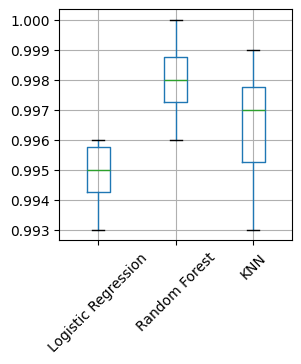

In [38]:
metrics.boxplot(figsize = (3,3));
plt.ylim=(0,1.05)
plt.xticks(rotation=45)

In [39]:
from scipy.stats import wilcoxon

print("\nWilcoxon Test Results:")
print("Logistic Regression vs Random Forest:", wilcoxon(metrics['Logistic Regression'], metrics['Random Forest']))
print("Logistic Regression vs KNN:", wilcoxon(metrics['Logistic Regression'], metrics['KNN']))
print("Random Forest vs KNN:", wilcoxon(metrics['Random Forest'], metrics['KNN']))


Wilcoxon Test Results:
Logistic Regression vs Random Forest: WilcoxonResult(statistic=np.float64(0.0), pvalue=np.float64(0.001953125))
Logistic Regression vs KNN: WilcoxonResult(statistic=np.float64(3.0), pvalue=np.float64(0.03389485352468927))
Random Forest vs KNN: WilcoxonResult(statistic=np.float64(2.0), pvalue=np.float64(0.024001453892338206))
